# YOLO Detection + MobileSAM Mask Refinement for ShrimpDiseaseBD2

This notebook trains a YOLO object detector on the Roboflow `shrimp-disease-bd2-v8m0b` dataset, then uses YOLO-predicted boxes as prompts for `mobile_sam.pt` to generate qualitative masks.

Important dataset assumptions:

- Object classes are `bg` and `wssv`.
- `bg` means blackgill disease, not background/healthy.
- Images with no object labels are treated as healthy negative images.
- Label files that contain both class ids `0` and `1` are class-swapped, because mixed-disease images in this dataset have inverted `bg`/`wssv` ids.
- After correction, all downloaded splits are pooled and rebuilt into a stratified train/valid/test split by disease state and object-count bin.
- The audit prints column counts, row-count/class-set patterns, box-size statistics, and visual samples before training.

The SAM stage is not a replacement for detection metrics. Because this dataset is object detection only, MobileSAM masks are visual refinements generated from predicted boxes, not mask-IoU-scored segmentation outputs.

## 1. Install Dependencies

In [20]:
!pip install -q -U ultralytics roboflow opencv-python pandas matplotlib pyyaml tqdm

## 2. Imports and Configuration

In [21]:
from pathlib import Path
import os
import random
import shutil
import time
import gc

import cv2
import numpy as np
import pandas as pd
import yaml
import subprocess
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from IPython.display import display

from roboflow import Roboflow
from ultralytics import YOLO, SAM

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

WORK_DIR = Path('/kaggle/working/shrimp_yolo_detect_sam_workdir')
OUTPUT_DIR = Path('/kaggle/working/shrimp_yolo_detect_sam_outputs')
RUNS_DIR = OUTPUT_DIR / 'detect_runs'
REPORT_DIR = OUTPUT_DIR / 'reports'
SAM_RUNS_DIR = OUTPUT_DIR / 'sam_runs'
SAM_VIS_DIR = OUTPUT_DIR / 'sam_visualizations'

for d in [WORK_DIR, OUTPUT_DIR, RUNS_DIR, REPORT_DIR, SAM_RUNS_DIR, SAM_VIS_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# Model switchboard. Change YOLO_MODEL if you want to compare other detectors.
YOLO_MODEL = 'yolo26n.pt'
MODEL_OPTIONS = [
    'yolo26n.pt',
    'yolov8n.pt',
    'yolo11n.pt',
]
RUN_BASE_NAME = Path(YOLO_MODEL).stem.replace('.', '_')

IMG_SIZE = 960
EPOCHS = 100
BATCH = -1      # Ultralytics auto-batch. Change to 16 or 32 if auto-batch is unstable.
PATIENCE = 30
DEVICE = 0
WORKERS = 2

# Detection analysis thresholds.
PREDICT_CONF_FOR_SCREENING = 0.25
THRESHOLD_SWEEP = [0.10, 0.25, 0.50]

# SAM configuration. MobileSAM was the best practical SAM option in the teammate benchmark.
SAM_MODEL = 'mobile_sam.pt'
SAM_IMGSZ = 1024
SAM_BOX_CONF = 0.15
SAM_BOX_IOU = 0.50
SAM_VIS_MAX_IMAGES = 8
SAM_MAX_BOXES_PER_IMAGE = 20

# Label correction controls. Mixed-class files are known to have inverted class ids.
SWAP_CLASS_IDS_IN_MIXED_CLASS_LABEL_FILES = True
LABEL_AUDIT_SAMPLE_PER_GROUP = 12

# Rebuild Roboflow splits into a balanced split before training.
USE_STRATIFIED_SPLIT = True
TRAIN_RATIO = 0.70
VALID_RATIO = 0.15
TEST_RATIO = 0.15

# Direct key requested by user. For public sharing, replace this with a Kaggle Secret.
ROBOFLOW_API_KEY = 'ihhX7aXWBA7MVJNVf1Mb'
ROBOFLOW_WORKSPACE = 'trainmodel1'
ROBOFLOW_PROJECT = 'shrimp-disease-bd2-v8m0b'
ROBOFLOW_VERSION = 1
# Roboflow export format controls dataset label packaging, not the YOLO model used for training.
# The yolo26 export can return a broken 1-byte zip on Roboflow, while yolov8 labels train yolo26n.pt correctly.
ROBOFLOW_FORMAT = 'yolo26'
ROBOFLOW_FORMAT_FALLBACKS = ['yolo26', 'yolov8', 'yolo11']

# Canonical class names for our reports. Original dataset uses bg/wssv.
CANONICAL_NAMES = ['blackgill', 'whitespot']
ORIGINAL_NAME_HINTS = {
    'bg': 'blackgill',
    'blackgill': 'blackgill',
    'black gill': 'blackgill',
    'wssv': 'whitespot',
    'white spot': 'whitespot',
    'whitespot': 'whitespot',
    'white_spot': 'whitespot',
}

IMAGE_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.bmp', '.webp')

print('WORK_DIR:', WORK_DIR)
print('OUTPUT_DIR:', OUTPUT_DIR)
print('YOLO_MODEL:', YOLO_MODEL)
print('IMG_SIZE:', IMG_SIZE, 'EPOCHS:', EPOCHS, 'BATCH:', BATCH)

WORK_DIR: /kaggle/working/shrimp_yolo_detect_sam_workdir
OUTPUT_DIR: /kaggle/working/shrimp_yolo_detect_sam_outputs
YOLO_MODEL: yolo26n.pt
IMG_SIZE: 960 EPOCHS: 100 BATCH: -1


## 3. Download Dataset from Roboflow

This notebook uses the Roboflow download code for `trainmodel1/shrimp-disease-bd2-v8m0b` version 1 with `yolo26` format first. Fallback formats are kept in case Roboflow export links are temporarily unavailable.

In [22]:
import zipfile

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace(ROBOFLOW_WORKSPACE).project(ROBOFLOW_PROJECT)
version = project.version(ROBOFLOW_VERSION)


def inspect_bad_zip(location):
    location = Path(location)
    zip_path = location / 'roboflow.zip'
    if not zip_path.exists():
        return 'roboflow.zip not found'
    size = zip_path.stat().st_size
    try:
        preview = zip_path.read_bytes()[:500]
    except Exception as e:
        preview = f'could not read preview: {e}'.encode()
    return f'{zip_path} size={size} first_bytes={preview!r}'


def try_sdk_download(version, fmt, location, retries=3, sleep_sec=20):
    location = Path(location)
    last_error = None
    for attempt in range(1, retries + 1):
        if location.exists():
            shutil.rmtree(location, ignore_errors=True)
        print(f'Trying Roboflow SDK download format={fmt}, attempt={attempt}/{retries}')
        try:
            dataset = version.download(fmt, location=str(location), overwrite=True)
            dataset_dir = Path(dataset.location)
            yaml_path = dataset_dir / 'data.yaml'
            if not yaml_path.exists():
                raise FileNotFoundError(f'Download finished but data.yaml was not found at {yaml_path}')
            print(f'Downloaded dataset using SDK format={fmt}: {dataset_dir}')
            return dataset_dir, fmt, 'sdk'
        except (zipfile.BadZipFile, FileNotFoundError, ValueError, RuntimeError) as e:
            last_error = e
            print(f'[WARN] SDK format {fmt} attempt {attempt} failed: {type(e).__name__}: {e}')
            print('Bad zip diagnostic:', inspect_bad_zip(location))
            if attempt < retries:
                print(f'Waiting {sleep_sec}s before retry. Roboflow export links are sometimes not ready immediately.')
                time.sleep(sleep_sec)
    return None, fmt, f'sdk_failed: {type(last_error).__name__}: {last_error}'


def try_cli_download(fmt, location):
    location = Path(location)
    if location.exists():
        shutil.rmtree(location, ignore_errors=True)
    location.mkdir(parents=True, exist_ok=True)
    print(f'Trying Roboflow CLI download format={fmt}: {location}')
    cmd = [
        'roboflow', 'download',
        '-f', fmt,
        '-l', str(location),
        '-w', ROBOFLOW_WORKSPACE,
        '-p', ROBOFLOW_PROJECT,
        '-v', str(ROBOFLOW_VERSION),
        '-k', ROBOFLOW_API_KEY,
    ]
    result = subprocess.run(cmd, text=True, capture_output=True)
    print('CLI return code:', result.returncode)
    if result.stdout:
        print('CLI stdout:', result.stdout[-2000:])
    if result.stderr:
        print('CLI stderr:', result.stderr[-2000:])

    yaml_candidates = list(location.rglob('data.yaml'))
    if yaml_candidates:
        dataset_dir = yaml_candidates[0].parent
        print(f'Downloaded dataset using CLI format={fmt}: {dataset_dir}')
        return dataset_dir, fmt, 'cli'
    print('CLI did not produce data.yaml.')
    return None, fmt, 'cli_failed'


def download_roboflow_with_fallbacks(version, formats, base_dir):
    attempts = []
    for fmt in dict.fromkeys(formats):
        sdk_location = Path(base_dir) / f'{ROBOFLOW_PROJECT}-{ROBOFLOW_VERSION}-{fmt}-sdk'
        dataset_dir, used_fmt, method = try_sdk_download(version, fmt, sdk_location)
        attempts.append({'format': fmt, 'method': method, 'location': str(sdk_location)})
        if dataset_dir is not None:
            return dataset_dir, used_fmt, method, pd.DataFrame(attempts)

        cli_location = Path(base_dir) / f'{ROBOFLOW_PROJECT}-{ROBOFLOW_VERSION}-{fmt}-cli'
        dataset_dir, used_fmt, method = try_cli_download(fmt, cli_location)
        attempts.append({'format': fmt, 'method': method, 'location': str(cli_location)})
        if dataset_dir is not None:
            return dataset_dir, used_fmt, method, pd.DataFrame(attempts)

    attempts_df = pd.DataFrame(attempts)
    display(attempts_df)
    raise RuntimeError('All Roboflow SDK and CLI download attempts failed. Check whether this Roboflow version is downloadable from the Roboflow web UI, or add the exported dataset as a Kaggle Input and set RAW_DATASET_DIR manually below.')


formats_to_try = [ROBOFLOW_FORMAT] + ROBOFLOW_FORMAT_FALLBACKS
RAW_DATASET_DIR, ROBOFLOW_FORMAT_USED, ROBOFLOW_DOWNLOAD_METHOD, download_attempts_df = download_roboflow_with_fallbacks(
    version,
    formats_to_try,
    WORK_DIR,
)

RAW_DATASET_DIR = Path(RAW_DATASET_DIR)
print('ROBOFLOW_FORMAT_USED:', ROBOFLOW_FORMAT_USED)
print('ROBOFLOW_DOWNLOAD_METHOD:', ROBOFLOW_DOWNLOAD_METHOD)
print('RAW_DATASET_DIR:', RAW_DATASET_DIR)
print('Files:', sorted([p.name for p in RAW_DATASET_DIR.iterdir()])[:20])
display(download_attempts_df)

loading Roboflow workspace...
loading Roboflow project...
Trying Roboflow SDK download format=yolo26, attempt=1/3



Extracting Dataset Version Zip to /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp-disease-bd2-v8m0b-1-yolo26-sdk in yolo26:: 100%|██████████| 2303/2303 [00:00<00:00, 3280.89it/s]


Downloaded dataset using SDK format=yolo26: /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp-disease-bd2-v8m0b-1-yolo26-sdk
ROBOFLOW_FORMAT_USED: yolo26
ROBOFLOW_DOWNLOAD_METHOD: sdk
RAW_DATASET_DIR: /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp-disease-bd2-v8m0b-1-yolo26-sdk
Files: ['README.dataset.txt', 'README.roboflow.txt', 'data.yaml', 'test', 'train', 'valid']


,format,method,location
0,yolo26,sdk,/kaggle/working/shrimp_yolo_detect_sam_workdir...


### Manual Kaggle Input Fallback

If Roboflow keeps returning a 1-byte zip, export the dataset from the Roboflow web UI, add it as a Kaggle Input, then uncomment and set `RAW_DATASET_DIR` below before continuing.


In [23]:
# Optional manual fallback. Leave commented when Roboflow download works.
# RAW_DATASET_DIR = Path('/kaggle/input/shrimp-disease-bd2-1')
# assert (RAW_DATASET_DIR / 'data.yaml').exists(), RAW_DATASET_DIR
# print('Using manual Kaggle input dataset:', RAW_DATASET_DIR)


## 4. Dataset Utilities

In [24]:
def load_yaml(path):
    with open(path, 'r') as f:
        return yaml.safe_load(f)


def save_yaml(data, path):
    with open(path, 'w') as f:
        yaml.safe_dump(data, f, sort_keys=False)


def normalize_names(names):
    if isinstance(names, dict):
        return [names[k] for k in sorted(names, key=lambda x: int(x))]
    return list(names)


def canonicalize_name(name):
    key = str(name).strip().lower().replace('-', ' ').replace('_', ' ')
    return ORIGINAL_NAME_HINTS.get(key, str(name).strip().lower())


def find_split_dirs(dataset_dir, split):
    dataset_dir = Path(dataset_dir)
    split_aliases = {
        'train': ['train'],
        'val': ['val', 'valid'],
        'valid': ['valid', 'val'],
        'test': ['test'],
    }
    aliases = split_aliases.get(split, [split])

    for alias in aliases:
        candidates = [
            (dataset_dir / alias / 'images', dataset_dir / alias / 'labels'),
            (dataset_dir / 'images' / alias, dataset_dir / 'labels' / alias),
        ]
        for img_dir, label_dir in candidates:
            if img_dir.exists():
                label_dir.mkdir(parents=True, exist_ok=True)
                return img_dir, label_dir
    raise FileNotFoundError(f'Could not find image directory for split={split} in {dataset_dir}')


def available_splits(dataset_dir):
    splits = []
    for split in ['train', 'valid', 'val', 'test']:
        try:
            find_split_dirs(dataset_dir, split)
            normalized = 'valid' if split == 'val' else split
            if normalized not in splits:
                splits.append(normalized)
        except FileNotFoundError:
            pass
    return splits


def list_images(image_dir):
    image_dir = Path(image_dir)
    images = []
    for ext in IMAGE_EXTENSIONS:
        images.extend(image_dir.glob(f'*{ext}'))
        images.extend(image_dir.glob(f'*{ext.upper()}'))
    return sorted(set(images))


def label_path_for_image(label_dir, image_path):
    return Path(label_dir) / f'{Path(image_path).stem}.txt'


def read_yolo_detect_labels(label_path):
    label_path = Path(label_path)
    if not label_path.exists():
        return []
    rows = []
    for raw in label_path.read_text().splitlines():
        raw = raw.strip()
        if not raw:
            continue
        parts = raw.split()
        if len(parts) < 5:
            continue
        rows.append(parts[:5])
    return rows


def write_yolo_detect_labels(label_path, rows):
    label_path = Path(label_path)
    label_path.parent.mkdir(parents=True, exist_ok=True)
    text = '\n'.join(' '.join(map(str, row)) for row in rows)
    label_path.write_text(text + ('\n' if text else ''))


def remove_yolo_caches(dataset_dir):
    for cache_path in Path(dataset_dir).rglob('*.cache'):
        cache_path.unlink(missing_ok=True)
        print('Removed stale cache:', cache_path)


def prepare_clean_dataset(raw_dataset_dir, clean_dataset_dir):
    raw_dataset_dir = Path(raw_dataset_dir)
    clean_dataset_dir = Path(clean_dataset_dir)
    if clean_dataset_dir.exists():
        shutil.rmtree(clean_dataset_dir)
    shutil.copytree(raw_dataset_dir, clean_dataset_dir)
    return clean_dataset_dir

print('Utilities loaded.')

Utilities loaded.


## 5. Correct Labels and Prepare YOLO Dataset

In [25]:
CORRECTED_DATASET_DIR = WORK_DIR / 'shrimp_disease_bd2_detect_corrected'
prepare_clean_dataset(RAW_DATASET_DIR, CORRECTED_DATASET_DIR)

raw_yaml = load_yaml(CORRECTED_DATASET_DIR / 'data.yaml')
raw_names = normalize_names(raw_yaml.get('names', []))
print('Raw names:', raw_names)
print('Canonical interpretation:', [canonicalize_name(n) for n in raw_names])

if len(raw_names) != 2:
    print('WARNING: Expected exactly two object classes. Inspect names before training:', raw_names)

def image_path_for_yaml(dataset_dir, split):
    img_dir, _ = find_split_dirs(dataset_dir, split)
    return str(img_dir.relative_to(dataset_dir)).replace('\\', '/')


# Keep class ids 0 and 1, but write clearer names for metrics.
# Class 0 is bg/blackgill disease, class 1 is wssv/whitespot disease.
raw_yaml['names'] = CANONICAL_NAMES
raw_yaml['nc'] = 2
raw_yaml['path'] = str(CORRECTED_DATASET_DIR)
raw_yaml['train'] = image_path_for_yaml(CORRECTED_DATASET_DIR, 'train')
if 'valid' in available_splits(CORRECTED_DATASET_DIR):
    raw_yaml['val'] = image_path_for_yaml(CORRECTED_DATASET_DIR, 'valid')
elif 'val' in available_splits(CORRECTED_DATASET_DIR):
    raw_yaml['val'] = image_path_for_yaml(CORRECTED_DATASET_DIR, 'val')
if 'test' in available_splits(CORRECTED_DATASET_DIR):
    raw_yaml['test'] = image_path_for_yaml(CORRECTED_DATASET_DIR, 'test')
raw_yaml.pop('valid', None)
save_yaml(raw_yaml, CORRECTED_DATASET_DIR / 'data.yaml')

correction_records = []
for split in available_splits(CORRECTED_DATASET_DIR):
    img_dir, label_dir = find_split_dirs(CORRECTED_DATASET_DIR, split)
    image_paths = list_images(img_dir)
    split_swapped = 0
    split_empty_created = 0
    split_mixed_class_label_files = 0
    split_mixed_class_label_files_swapped = 0

    for image_path in tqdm(image_paths, desc=f'Correct labels: {split}'):
        label_path = label_path_for_image(label_dir, image_path)
        if not label_path.exists():
            write_yolo_detect_labels(label_path, [])
            split_empty_created += 1

        rows = read_yolo_detect_labels(label_path)
        class_ids = [row[0] for row in rows]
        has_both_classes = set(class_ids) == {'0', '1'}
        if has_both_classes:
            split_mixed_class_label_files += 1
        if SWAP_CLASS_IDS_IN_MIXED_CLASS_LABEL_FILES and has_both_classes:
            swapped_rows = []
            for row in rows:
                new_row = row.copy()
                if new_row[0] == '0':
                    new_row[0] = '1'
                elif new_row[0] == '1':
                    new_row[0] = '0'
                swapped_rows.append(new_row)
            write_yolo_detect_labels(label_path, swapped_rows)
            split_swapped += 1
            split_mixed_class_label_files_swapped += 1

    correction_records.append({
        'split': split,
        'images': len(image_paths),
        'empty_label_files_created': split_empty_created,
        'mixed_class_label_files': split_mixed_class_label_files,
        'mixed_class_label_files_swapped': split_mixed_class_label_files_swapped,
        'swapped_files_total': split_swapped,
    })

remove_yolo_caches(CORRECTED_DATASET_DIR)
correction_df = pd.DataFrame(correction_records)
display(correction_df)
print('Corrected data.yaml:')
print(yaml.safe_dump(load_yaml(CORRECTED_DATASET_DIR / 'data.yaml'), sort_keys=False))

Raw names: ['BG', 'WSSV']
Canonical interpretation: ['blackgill', 'whitespot']


Correct labels: train:   0%|          | 0/804 [00:00<?, ?it/s]

Correct labels: valid:   0%|          | 0/230 [00:00<?, ?it/s]

Correct labels: test:   0%|          | 0/115 [00:00<?, ?it/s]

,split,images,empty_label_files_created,mixed_class_label_files,mixed_class_label_files_swapped,swapped_files_total
0,train,804,0,60,60,60
1,valid,230,0,149,149,149
2,test,115,0,9,9,9


Corrected data.yaml:
train: train/images
val: valid/images
test: test/images
nc: 2
names:
- blackgill
- whitespot
roboflow:
  workspace: trainmodel1
  project: shrimp-disease-bd2-v8m0b
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/trainmodel1/shrimp-disease-bd2-v8m0b/dataset/1
path: /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp_disease_bd2_detect_corrected



## 6. Create Stratified Split

Pool all downloaded images after label correction, then rebuild train/valid/test splits stratified by disease state and object-count bin. This fixes Roboflow split imbalance before training.


In [26]:
def object_count_bin(n):
    if n == 0:
        return '0'
    if n <= 2:
        return '1-2'
    if n <= 5:
        return '3-5'
    if n <= 10:
        return '6-10'
    if n <= 20:
        return '11-20'
    return '21+'


def label_state_from_rows(rows):
    classes = set()
    for row in rows:
        try:
            classes.add(int(float(row[0])))
        except Exception:
            pass
    if not classes:
        return 'healthy'
    if classes == {0}:
        return 'blackgill_only'
    if classes == {1}:
        return 'whitespot_only'
    if classes == {0, 1}:
        return 'both'
    return 'unknown'


def collect_split_samples(dataset_dir):
    samples = []
    seen_keys = set()
    for source_split in available_splits(dataset_dir):
        img_dir, label_dir = find_split_dirs(dataset_dir, source_split)
        for image_path in list_images(img_dir):
            label_path = label_path_for_image(label_dir, image_path)
            rows = read_yolo_detect_labels(label_path)
            state = label_state_from_rows(rows)
            count_bin = object_count_bin(len(rows))
            strat_key = f'{state}|{count_bin}'
            # Prefix source split to avoid filename collisions and make leakage checks easier.
            safe_stem = f'{source_split}__{image_path.stem}'
            if safe_stem in seen_keys:
                suffix = 2
                while f'{safe_stem}__dup{suffix}' in seen_keys:
                    suffix += 1
                safe_stem = f'{safe_stem}__dup{suffix}'
            seen_keys.add(safe_stem)
            samples.append({
                'source_split': source_split,
                'image_path': image_path,
                'label_path': label_path,
                'rows': len(rows),
                'state': state,
                'count_bin': count_bin,
                'strat_key': strat_key,
                'safe_stem': safe_stem,
            })
    return pd.DataFrame(samples)


def split_group_indices(indices, train_ratio=TRAIN_RATIO, valid_ratio=VALID_RATIO, test_ratio=TEST_RATIO):
    indices = list(indices)
    random.Random(SEED).shuffle(indices)
    n = len(indices)
    if n == 0:
        return [], [], []
    if n == 1:
        return indices, [], []
    if n == 2:
        return indices[:1], [], indices[1:]

    n_train = max(1, int(round(n * train_ratio)))
    n_valid = max(1, int(round(n * valid_ratio)))
    n_test = n - n_train - n_valid
    if n_test < 1:
        n_test = 1
        if n_train >= n_valid and n_train > 1:
            n_train -= 1
        elif n_valid > 1:
            n_valid -= 1
    while n_train + n_valid + n_test > n:
        if n_train >= n_valid and n_train > 1:
            n_train -= 1
        elif n_valid > 1:
            n_valid -= 1
        else:
            n_test -= 1
    return indices[:n_train], indices[n_train:n_train+n_valid], indices[n_train+n_valid:]


def make_stratified_dataset(source_dataset_dir, output_dataset_dir):
    source_dataset_dir = Path(source_dataset_dir)
    output_dataset_dir = Path(output_dataset_dir)
    if output_dataset_dir.exists():
        shutil.rmtree(output_dataset_dir)

    for split in ['train', 'valid', 'test']:
        (output_dataset_dir / 'images' / split).mkdir(parents=True, exist_ok=True)
        (output_dataset_dir / 'labels' / split).mkdir(parents=True, exist_ok=True)

    samples_df = collect_split_samples(source_dataset_dir)
    assigned = []
    for strat_key, group_df in samples_df.groupby('strat_key'):
        train_idx, valid_idx, test_idx = split_group_indices(group_df.index.tolist())
        assigned.extend([(idx, 'train') for idx in train_idx])
        assigned.extend([(idx, 'valid') for idx in valid_idx])
        assigned.extend([(idx, 'test') for idx in test_idx])

    assignment_df = pd.DataFrame(assigned, columns=['sample_index', 'split'])
    split_df = samples_df.join(assignment_df.set_index('sample_index'), how='left')
    split_df['split'] = split_df['split'].fillna('train')

    for _, row in tqdm(split_df.iterrows(), total=len(split_df), desc='Copy stratified split'):
        image_path = Path(row['image_path'])
        label_path = Path(row['label_path'])
        out_image = output_dataset_dir / 'images' / row['split'] / f"{row['safe_stem']}{image_path.suffix.lower()}"
        out_label = output_dataset_dir / 'labels' / row['split'] / f"{row['safe_stem']}.txt"
        shutil.copy2(image_path, out_image)
        if label_path.exists():
            shutil.copy2(label_path, out_label)
        else:
            write_yolo_detect_labels(out_label, [])

    data_yaml = {
        'path': str(output_dataset_dir),
        'train': 'images/train',
        'val': 'images/valid',
        'test': 'images/test',
        'nc': 2,
        'names': CANONICAL_NAMES,
    }
    save_yaml(data_yaml, output_dataset_dir / 'data.yaml')
    split_df.to_csv(REPORT_DIR / 'stratified_split_assignments.csv', index=False)

    split_summary = split_df.groupby(['split', 'state']).size().unstack(fill_value=0).reset_index()
    object_summary = split_df.groupby(['split', 'count_bin']).size().unstack(fill_value=0).reset_index()
    key_summary = split_df.groupby(['split', 'strat_key']).size().reset_index(name='images')
    split_summary.to_csv(REPORT_DIR / 'stratified_split_state_summary.csv', index=False)
    object_summary.to_csv(REPORT_DIR / 'stratified_split_count_bin_summary.csv', index=False)
    key_summary.to_csv(REPORT_DIR / 'stratified_split_key_summary.csv', index=False)
    return output_dataset_dir, split_df, split_summary, object_summary, key_summary


if USE_STRATIFIED_SPLIT:
    PRE_STRATIFIED_DATASET_DIR = CORRECTED_DATASET_DIR
    STRATIFIED_DATASET_DIR = WORK_DIR / 'shrimp_disease_bd2_detect_stratified'
    CORRECTED_DATASET_DIR, stratified_split_df, strat_state_summary, strat_count_summary, strat_key_summary = make_stratified_dataset(
        PRE_STRATIFIED_DATASET_DIR,
        STRATIFIED_DATASET_DIR,
    )
    remove_yolo_caches(CORRECTED_DATASET_DIR)
    print('Using stratified dataset for all downstream cells:', CORRECTED_DATASET_DIR)
    print('Stratified state summary:')
    display(strat_state_summary)
    print('Stratified object-count-bin summary:')
    display(strat_count_summary)
    print('Top stratification keys by split:')
    display(strat_key_summary.sort_values(['split', 'images'], ascending=[True, False]).head(60))
else:
    print('Using Roboflow-provided split:', CORRECTED_DATASET_DIR)

Copy stratified split:   0%|          | 0/1149 [00:00<?, ?it/s]

Using stratified dataset for all downstream cells: /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp_disease_bd2_detect_stratified
Stratified state summary:


state,split,blackgill_only,both,healthy,whitespot_only
0,test,32,33,61,49
1,train,138,152,282,230
2,valid,30,33,60,49


Stratified object-count-bin summary:


count_bin,split,0,1-2,11-20,21+,3-5,6-10
0,test,61,26,21,4,29,34
1,train,282,112,99,20,126,163
2,valid,60,24,22,4,26,36


Top stratification keys by split:


,split,strat_key,images
9,test,healthy|0,61
0,test,blackgill_only|1-2,21
8,test,both|6-10,17
14,test,whitespot_only|6-10,16
13,test,whitespot_only|3-5,15
11,test,whitespot_only|11-20,11
2,test,blackgill_only|3-5,9
5,test,both|11-20,9
7,test,both|3-5,5
10,test,whitespot_only|1-2,4


## 7. Inspect Corrected Dataset Distribution


TRAIN
split: train
images: 802
healthy_images: 282
blackgill_only_images: 138
whitespot_only_images: 230
both_images: 152
blackgill_objects: 649
whitespot_objects: 3266
label_count_hist: {1: 53, 2: 59, 3: 54, 0: 282, 8: 40, 12: 17, 11: 21, 4: 30, 16: 6, 28: 2, 21: 3, 24: 1, 13: 12, 5: 42, 10: 29, 14: 16, 7: 35, 9: 30, 23: 1, 18: 8, 6: 29, 15: 9, 17: 5, 40: 1, 37: 1, 20: 2, 19: 3, 32: 1, 30: 2, 44: 1, 22: 3, 42: 1, 38: 1, 29: 1, 27: 1}

VALID
split: valid
images: 172
healthy_images: 60
blackgill_only_images: 30
whitespot_only_images: 49
both_images: 33
blackgill_objects: 136
whitespot_objects: 708
label_count_hist: {2: 12, 1: 12, 3: 10, 15: 2, 0: 60, 4: 8, 5: 8, 7: 6, 11: 4, 16: 4, 24: 1, 10: 7, 6: 8, 8: 9, 9: 6, 23: 1, 12: 2, 25: 1, 28: 1, 14: 2, 13: 3, 17: 2, 18: 1, 20: 1, 19: 1}

TEST
split: test
images: 175
healthy_images: 61
blackgill_only_images: 32
whitespot_only_images: 49
both_images: 33
blackgill_objects: 144
whitespot_objects: 666
label_count_hist: {2: 15, 0: 61, 5: 11, 8: 1

,split,images,healthy_images,blackgill_only_images,whitespot_only_images,both_images,blackgill_objects,whitespot_objects,label_count_hist
0,train,802,282,138,230,152,649,3266,"{1: 53, 2: 59, 3: 54, 0: 282, 8: 40, 12: 17, 1..."
1,valid,172,60,30,49,33,136,708,"{2: 12, 1: 12, 3: 10, 15: 2, 0: 60, 4: 8, 5: 8..."
2,test,175,61,32,49,33,144,666,"{2: 15, 0: 61, 5: 11, 8: 12, 7: 7, 11: 8, 14: ..."


state,blackgill_only,both,healthy,whitespot_only
split,,,,
test,32,33,61,49
train,138,152,282,230
valid,30,33,60,49


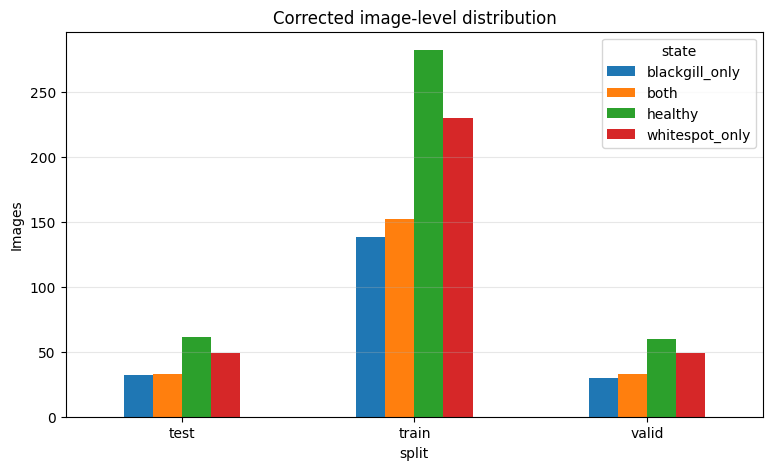

In [27]:
def summarize_detection_split(dataset_dir, split):
    img_dir, label_dir = find_split_dirs(dataset_dir, split)
    image_paths = list_images(img_dir)
    object_counts = {0: 0, 1: 0}
    image_states = {'healthy': 0, 'blackgill_only': 0, 'whitespot_only': 0, 'both': 0, 'empty_or_invalid': 0}
    label_count_hist = {}

    for image_path in image_paths:
        rows = read_yolo_detect_labels(label_path_for_image(label_dir, image_path))
        label_count_hist[len(rows)] = label_count_hist.get(len(rows), 0) + 1
        classes = []
        for row in rows:
            try:
                cls_id = int(float(row[0]))
            except ValueError:
                continue
            if cls_id in object_counts:
                object_counts[cls_id] += 1
                classes.append(cls_id)

        class_set = set(classes)
        if len(classes) == 0:
            image_states['healthy'] += 1
        elif class_set == {0}:
            image_states['blackgill_only'] += 1
        elif class_set == {1}:
            image_states['whitespot_only'] += 1
        elif class_set == {0, 1}:
            image_states['both'] += 1
        else:
            image_states['empty_or_invalid'] += 1

    return {
        'split': split,
        'images': len(image_paths),
        'healthy_images': image_states['healthy'],
        'blackgill_only_images': image_states['blackgill_only'],
        'whitespot_only_images': image_states['whitespot_only'],
        'both_images': image_states['both'],
        'blackgill_objects': object_counts[0],
        'whitespot_objects': object_counts[1],
        'label_count_hist': label_count_hist,
    }

split_summaries = []
for split in available_splits(CORRECTED_DATASET_DIR):
    summary = summarize_detection_split(CORRECTED_DATASET_DIR, split)
    split_summaries.append(summary)
    print('\n' + split.upper())
    for k, v in summary.items():
        print(f'{k}: {v}')

split_df = pd.DataFrame(split_summaries)
display(split_df)

plot_rows = []
for row in split_summaries:
    plot_rows.extend([
        {'split': row['split'], 'state': 'healthy', 'images': row['healthy_images']},
        {'split': row['split'], 'state': 'blackgill_only', 'images': row['blackgill_only_images']},
        {'split': row['split'], 'state': 'whitespot_only', 'images': row['whitespot_only_images']},
        {'split': row['split'], 'state': 'both', 'images': row['both_images']},
    ])
plot_df = pd.DataFrame(plot_rows)
if len(plot_df):
    pivot = plot_df.pivot(index='split', columns='state', values='images').fillna(0)
    display(pivot)
    pivot.plot(kind='bar', figsize=(9, 5))
    plt.title('Corrected image-level distribution')
    plt.ylabel('Images')
    plt.xticks(rotation=0)
    plt.grid(axis='y', alpha=0.3)
    plt.show()

## 8. Label Format and Correction Audit

Run this before training. The outputs here are meant to diagnose whether labels are true YOLO boxes, whether class ids look swapped, and which image groups need visual inspection. Share these outputs back if metrics are still low.


Label audit summary:


,split,images,total_label_rows,column_count_hist,label_rows_per_image_hist,signature_hist,class_row_hist,bad_value_rows,out_of_range_box_rows
0,train,802,3915,{5: 3915},"{0: 282, 1: 53, 2: 59, 3: 54, 4: 30, 5: 42, 6:...","{'healthy_empty': 282, 'blackgill_only_1obj': ...","{0: 649, 1: 3266}",0,0
1,valid,172,844,{5: 844},"{0: 60, 1: 12, 2: 12, 3: 10, 4: 8, 5: 8, 6: 8,...","{'healthy_empty': 60, 'blackgill_only_1obj': 1...","{0: 136, 1: 708}",0,0
2,test,175,810,{5: 810},"{0: 61, 1: 11, 2: 15, 3: 11, 4: 7, 5: 11, 6: 7...","{'healthy_empty': 61, 'blackgill_only_1obj': 1...","{0: 144, 1: 666}",0,0


Box size summary by split/class:


,split,class_name,rows,mean_w,median_w,mean_h,median_h,mean_area,median_area,p05_area,p95_area
0,test,blackgill,144,0.044271,0.035400,0.037791,0.028564,0.002163,0.001088,0.000126,0.006993
1,test,whitespot,666,0.025234,0.020996,0.026941,0.023193,0.000892,0.000506,0.000047,0.002750
2,train,blackgill,649,0.042260,0.031738,0.038353,0.031738,0.002113,0.001015,0.000100,0.008697
3,train,whitespot,3266,0.023802,0.020020,0.024057,0.020508,0.000754,0.000409,0.000040,0.002534
4,valid,blackgill,136,0.045403,0.032471,0.038402,0.031738,0.002207,0.001131,0.000200,0.008160
5,valid,whitespot,708,0.025051,0.020020,0.024351,0.021484,0.000778,0.000443,0.000037,0.002572


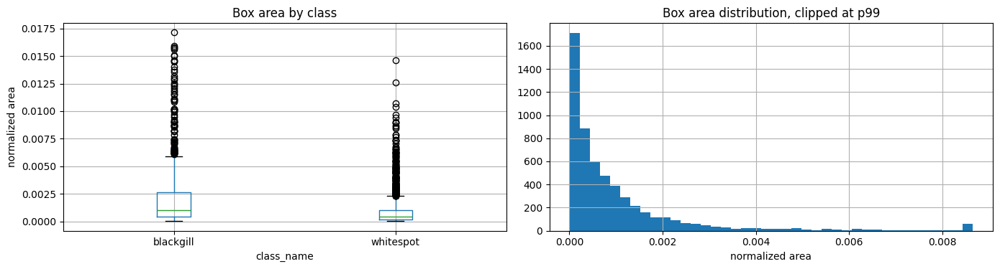

Most common label signatures:


,split,signature,images
21,test,healthy_empty,61
1,test,blackgill_only_1obj,11
2,test,blackgill_only_2obj,10
34,test,whitespot_only_5obj,8
20,test,"both_or_mixed_8obj_classes_[0, 1]",7
23,test,whitespot_only_11obj,5
37,test,whitespot_only_8obj,5
3,test,blackgill_only_3obj,4
7,test,"both_or_mixed_10obj_classes_[0, 1]",4
19,test,"both_or_mixed_7obj_classes_[0, 1]",4


In [28]:
from collections import Counter, defaultdict


def parse_label_file_raw(label_path):
    label_path = Path(label_path)
    if not label_path.exists():
        return []
    rows = []
    for raw in label_path.read_text().splitlines():
        raw = raw.strip()
        if not raw:
            continue
        parts = raw.split()
        rows.append(parts)
    return rows


def label_file_signature(rows):
    if not rows:
        return 'healthy_empty'
    classes = []
    for row in rows:
        try:
            classes.append(int(float(row[0])))
        except Exception:
            classes.append('bad_cls')
    unique = sorted(set(classes), key=str)
    if len(unique) == 1:
        cls = unique[0]
        cls_name = CANONICAL_NAMES[cls] if isinstance(cls, int) and cls < len(CANONICAL_NAMES) else str(cls)
        return f'{cls_name}_only_{len(rows)}obj'
    return f'both_or_mixed_{len(rows)}obj_classes_{unique}'


def collect_label_audit(dataset_dir):
    records = []
    size_records = []
    split_summaries = []
    for split in available_splits(dataset_dir):
        img_dir, label_dir = find_split_dirs(dataset_dir, split)
        images = list_images(img_dir)
        column_counter = Counter()
        row_count_counter = Counter()
        signature_counter = Counter()
        class_counter = Counter()
        bad_value_rows = 0
        out_of_range_rows = 0
        total_rows = 0

        for image_path in images:
            label_path = label_path_for_image(label_dir, image_path)
            rows = parse_label_file_raw(label_path)
            row_count_counter[len(rows)] += 1
            signature = label_file_signature(rows)
            signature_counter[signature] += 1
            records.append({
                'split': split,
                'image': str(image_path),
                'label': str(label_path),
                'rows': len(rows),
                'signature': signature,
                'classes': ','.join(row[0] for row in rows) if rows else '',
                'column_counts': ','.join(str(len(row)) for row in rows) if rows else '0',
            })

            for row in rows:
                total_rows += 1
                column_counter[len(row)] += 1
                try:
                    cls_id = int(float(row[0]))
                    vals = [float(v) for v in row[1:]]
                except Exception:
                    bad_value_rows += 1
                    continue
                class_counter[cls_id] += 1
                if len(vals) >= 4:
                    x, y, bw, bh = vals[:4]
                    if not (0 <= x <= 1 and 0 <= y <= 1 and 0 <= bw <= 1 and 0 <= bh <= 1):
                        out_of_range_rows += 1
                    size_records.append({
                        'split': split,
                        'class_id': cls_id,
                        'class_name': CANONICAL_NAMES[cls_id] if cls_id < len(CANONICAL_NAMES) else str(cls_id),
                        'box_w': bw,
                        'box_h': bh,
                        'box_area': bw * bh,
                        'columns': len(row),
                    })

        split_summaries.append({
            'split': split,
            'images': len(images),
            'total_label_rows': total_rows,
            'column_count_hist': dict(sorted(column_counter.items())),
            'label_rows_per_image_hist': dict(sorted(row_count_counter.items())),
            'signature_hist': dict(signature_counter.most_common(20)),
            'class_row_hist': dict(sorted(class_counter.items())),
            'bad_value_rows': bad_value_rows,
            'out_of_range_box_rows': out_of_range_rows,
        })

    return pd.DataFrame(split_summaries), pd.DataFrame(records), pd.DataFrame(size_records)


audit_summary_df, audit_records_df, box_size_df = collect_label_audit(CORRECTED_DATASET_DIR)
print('Label audit summary:')
display(audit_summary_df)

audit_records_df.to_csv(REPORT_DIR / 'label_audit_records.csv', index=False)
audit_summary_df.to_csv(REPORT_DIR / 'label_audit_summary.csv', index=False)
box_size_df.to_csv(REPORT_DIR / 'label_box_size_stats_raw.csv', index=False)

if len(box_size_df):
    print('Box size summary by split/class:')
    box_stats = box_size_df.groupby(['split', 'class_name']).agg(
        rows=('box_area', 'count'),
        mean_w=('box_w', 'mean'),
        median_w=('box_w', 'median'),
        mean_h=('box_h', 'mean'),
        median_h=('box_h', 'median'),
        mean_area=('box_area', 'mean'),
        median_area=('box_area', 'median'),
        p05_area=('box_area', lambda s: float(s.quantile(0.05))),
        p95_area=('box_area', lambda s: float(s.quantile(0.95))),
    ).reset_index()
    display(box_stats)
    box_stats.to_csv(REPORT_DIR / 'label_box_size_stats_by_class.csv', index=False)

    fig, ax = plt.subplots(1, 2, figsize=(14, 4))
    box_size_df.boxplot(column='box_area', by='class_name', ax=ax[0])
    ax[0].set_title('Box area by class')
    ax[0].set_ylabel('normalized area')
    ax[0].figure.suptitle('')
    box_size_df['box_area'].clip(upper=box_size_df['box_area'].quantile(0.99)).hist(ax=ax[1], bins=40)
    ax[1].set_title('Box area distribution, clipped at p99')
    ax[1].set_xlabel('normalized area')
    plt.tight_layout()
    plt.show()

print('Most common label signatures:')
display(audit_records_df.groupby(['split', 'signature']).size().reset_index(name='images').sort_values(['split', 'images'], ascending=[True, False]).head(50))

## 9. Visual Audit by Label Group

These grids intentionally sample different row-count and class-signature groups. If a group is swapped or boxes are malformed, it should be visible here before training.


Available train signatures: ['blackgill_only_16obj', 'blackgill_only_18obj', 'blackgill_only_1obj', 'blackgill_only_23obj', 'blackgill_only_2obj', 'blackgill_only_3obj', 'blackgill_only_4obj', 'blackgill_only_5obj', 'blackgill_only_8obj', 'blackgill_only_9obj', 'both_or_mixed_10obj_classes_[0, 1]', 'both_or_mixed_11obj_classes_[0, 1]', 'both_or_mixed_12obj_classes_[0, 1]', 'both_or_mixed_13obj_classes_[0, 1]', 'both_or_mixed_14obj_classes_[0, 1]', 'both_or_mixed_15obj_classes_[0, 1]', 'both_or_mixed_16obj_classes_[0, 1]', 'both_or_mixed_17obj_classes_[0, 1]', 'both_or_mixed_18obj_classes_[0, 1]', 'both_or_mixed_27obj_classes_[0, 1]', 'both_or_mixed_2obj_classes_[0, 1]', 'both_or_mixed_3obj_classes_[0, 1]', 'both_or_mixed_4obj_classes_[0, 1]', 'both_or_mixed_5obj_classes_[0, 1]', 'both_or_mixed_6obj_classes_[0, 1]', 'both_or_mixed_7obj_classes_[0, 1]', 'both_or_mixed_8obj_classes_[0, 1]', 'both_or_mixed_9obj_classes_[0, 1]', 'healthy_empty', 'whitespot_only_10obj', 'whitespot_only_11obj

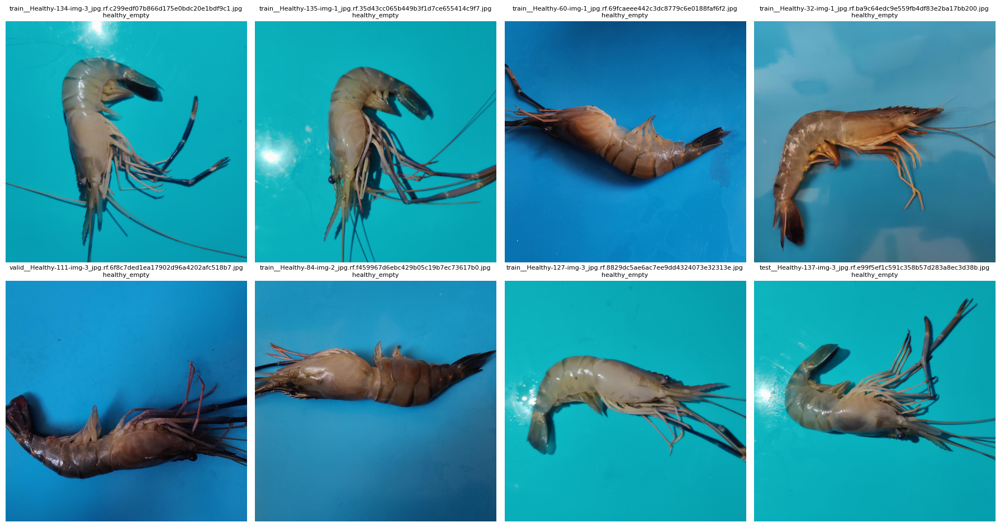

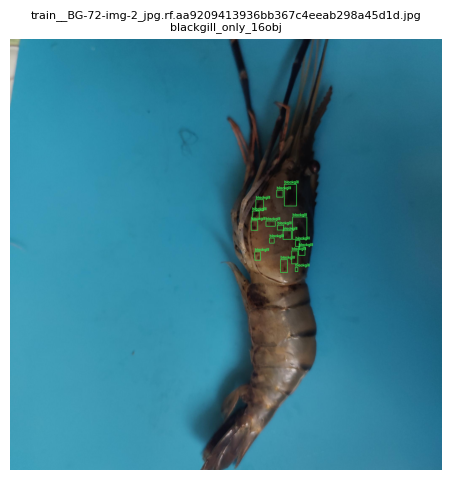

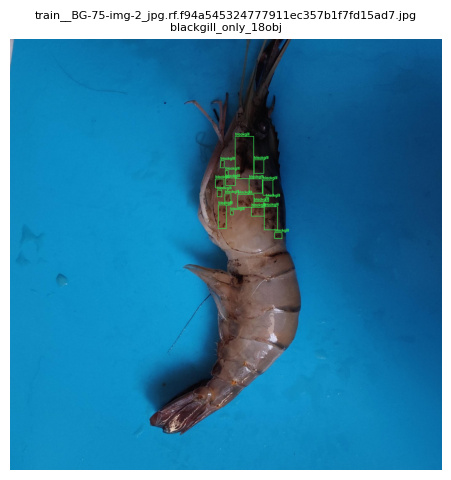

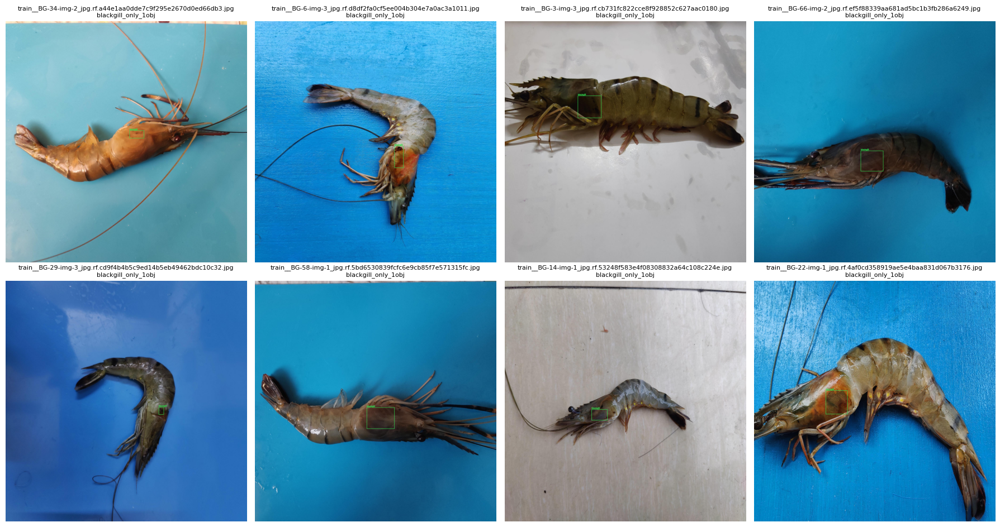

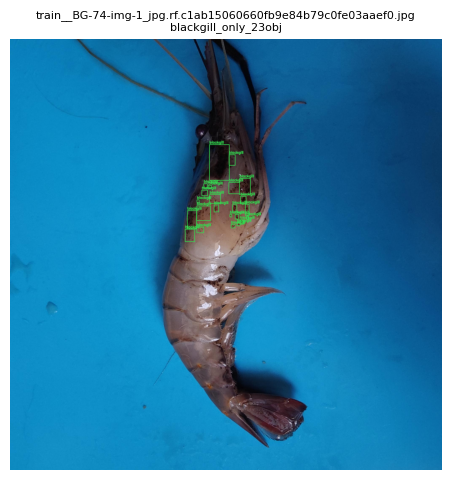

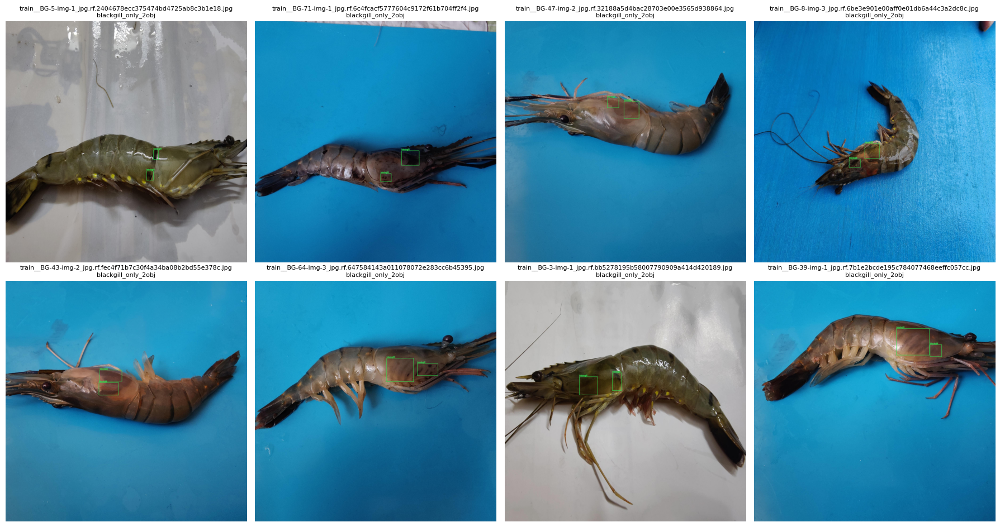

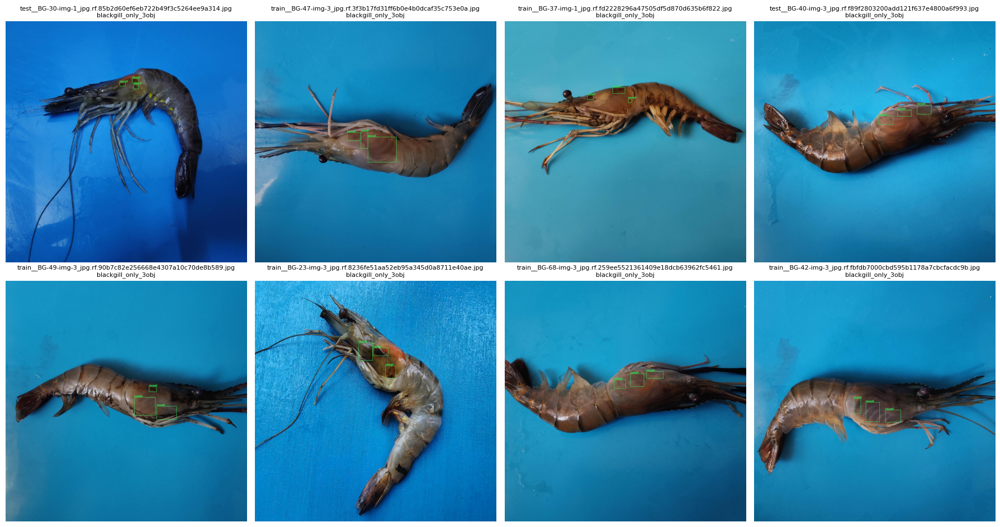

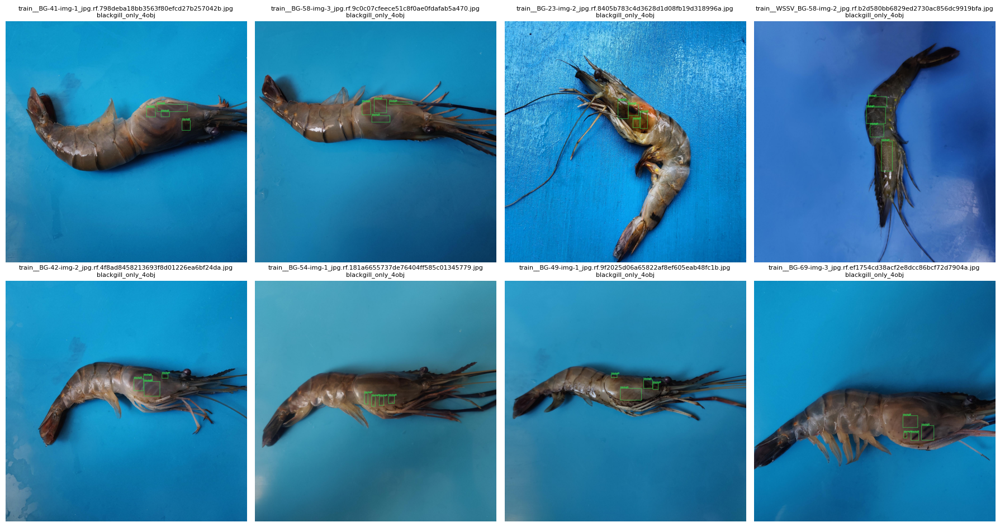

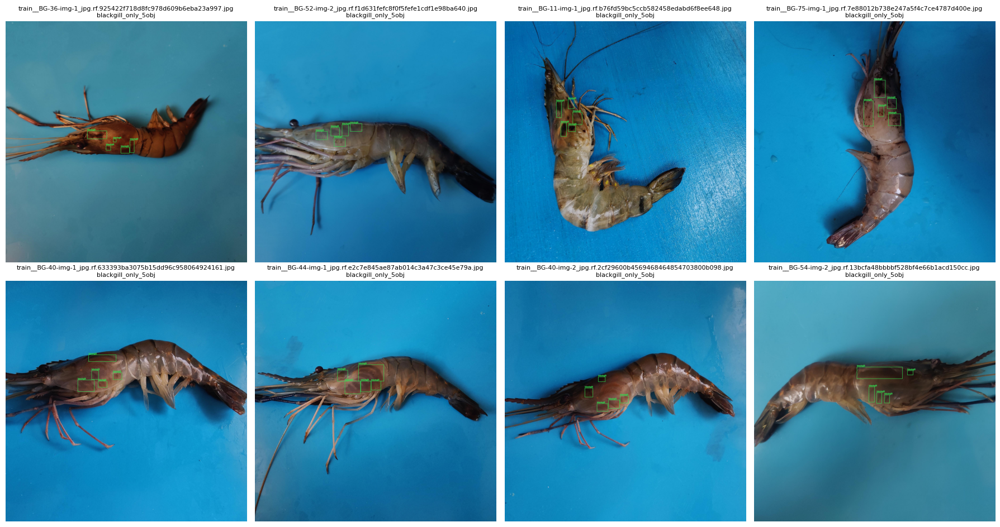

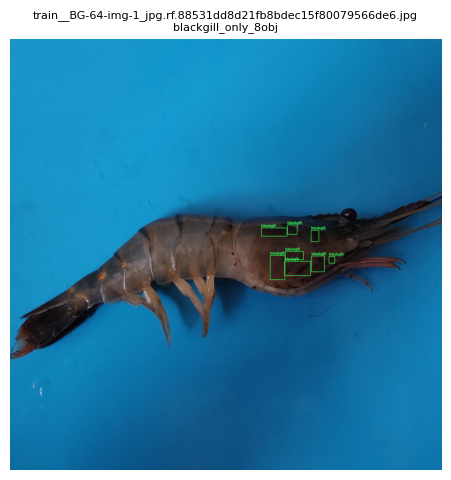

In [31]:
CLASS_COLORS = {
    0: (50, 220, 80),    # blackgill
    1: (230, 210, 40),   # whitespot
}


def sample_images_by_signature(records_df, split='train', per_group=LABEL_AUDIT_SAMPLE_PER_GROUP):
    groups = {}
    split_df = records_df[records_df['split'] == split].copy()
    for signature, group_df in split_df.groupby('signature'):
        sampled = group_df.sample(n=min(per_group, len(group_df)), random_state=SEED)
        groups[signature] = sampled['image'].map(Path).tolist()
    return groups

def draw_yolo_boxes(image_path, label_path, names=CANONICAL_NAMES):
    img = cv2.imread(str(image_path))
    if img is None:
        return None
    h, w = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    rows = read_yolo_detect_labels(label_path)
    for row in rows:
        cls_id = int(float(row[0]))
        x, y, bw, bh = map(float, row[1:5])
        x1 = int((x - bw / 2) * w)
        y1 = int((y - bh / 2) * h)
        x2 = int((x + bw / 2) * w)
        y2 = int((y + bh / 2) * h)
        color = CLASS_COLORS.get(cls_id, (255, 255, 255))
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, 2)
        label = names[cls_id] if cls_id < len(names) else str(cls_id)
        cv2.putText(img_rgb, label, (x1, max(15, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
    return img_rgb

def show_labeled_grid(image_paths, title, cols=4):
    if not image_paths:
        print('No samples for:', title)
        return
    rows = int(np.ceil(len(image_paths) / cols))
    plt.figure(figsize=(18, 4.8 * rows))
    for idx, image_path in enumerate(image_paths, 1):
        img_dir, label_dir = find_split_dirs(CORRECTED_DATASET_DIR, 'train')
        # Resolve label dir by searching split from path.
        image_path = Path(image_path)
        split = image_path.parts[-3] if len(image_path.parts) >= 3 and image_path.parts[-2] == 'images' else 'train'
        try:
            _, label_dir = find_split_dirs(CORRECTED_DATASET_DIR, split)
        except FileNotFoundError:
            label_dir = image_path.parent.parent / 'labels'
        drawn = draw_yolo_boxes(image_path, label_path_for_image(label_dir, image_path))
        plt.subplot(rows, cols, idx)
        if drawn is not None:
            plt.imshow(drawn)
        plt.title(f'{image_path.name}\n{title}', fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

signature_samples = sample_images_by_signature(audit_records_df, split='train', per_group=8)
print('Available train signatures:', list(signature_samples.keys()))

# Show healthy, one-class groups, and mixed/multi-object groups separately to make class inversion visible.
priority_signatures = []
for key in signature_samples:
    if key == 'healthy_empty':
        priority_signatures.append(key)
for key in signature_samples:
    if 'blackgill_only' in key or 'whitespot_only' in key:
        priority_signatures.append(key)
for key in signature_samples:
    if key not in priority_signatures:
        priority_signatures.append(key)

for signature in priority_signatures[:10]:
    show_labeled_grid(signature_samples[signature], signature, cols=4)

## 10. Visualize Corrected Detection Labels

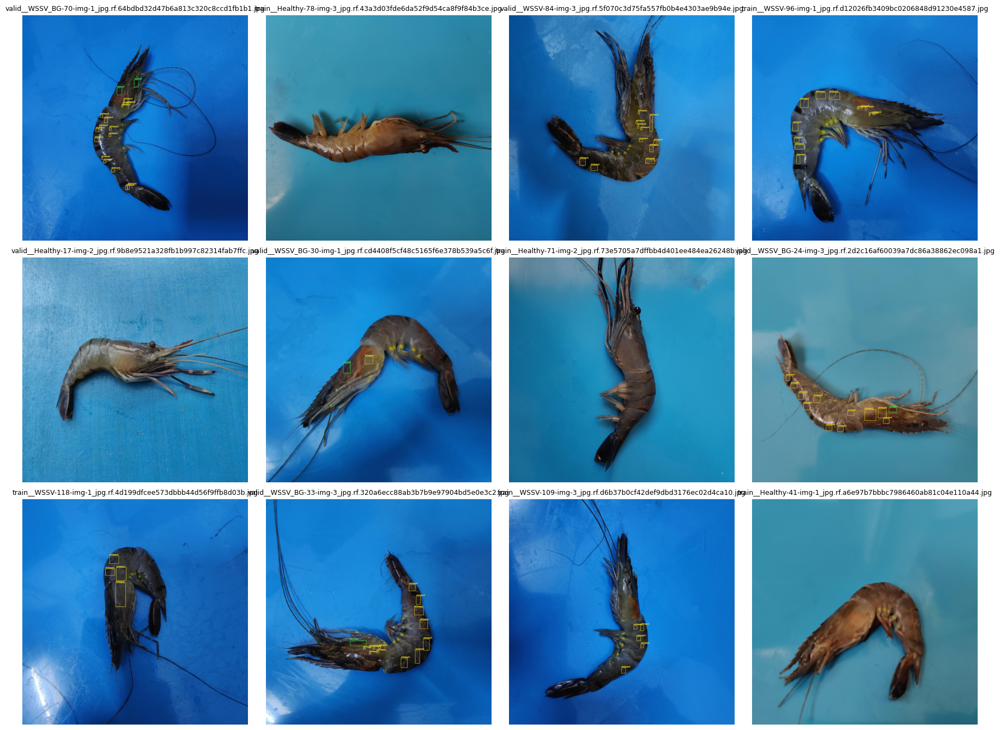

In [32]:



train_img_dir, train_label_dir = find_split_dirs(CORRECTED_DATASET_DIR, 'train')
train_images = list_images(train_img_dir)
random.shuffle(train_images)
sample_images = train_images[:12]

cols = 4
rows = int(np.ceil(len(sample_images) / cols))
plt.figure(figsize=(18, 4.5 * rows))
for idx, image_path in enumerate(sample_images, 1):
    drawn = draw_yolo_boxes(image_path, label_path_for_image(train_label_dir, image_path))
    plt.subplot(rows, cols, idx)
    if drawn is not None:
        plt.imshow(drawn)
    plt.title(image_path.name, fontsize=9)
    plt.axis('off')
plt.tight_layout()
plt.show()

## 11. Train YOLO Object Detector

In [ ]:
TRAIN_ARGS = {
    'data': str(CORRECTED_DATASET_DIR / 'data.yaml'),
    'task': 'detect',
    'epochs': EPOCHS,
    'imgsz': IMG_SIZE,
    'batch': BATCH,
    'patience': PATIENCE,
    'device': DEVICE,
    'workers': WORKERS,
    'project': str(RUNS_DIR),
    'name': f'{RUN_BASE_NAME}_shrimpbd2_detect',
    'exist_ok': True,
    'pretrained': True,
    'optimizer': 'auto',
    'seed': SEED,
    'deterministic': True,
    'verbose': True,
    'plots': True,
    'val': True,
    # Conservative augmentation. Tune here if whitespot recall stays low.
    'auto_augment': None,
    'erasing': 0.0,
    'mosaic': 0.30,
    'close_mosaic': 10,
    'mixup': 0.0,
    'cutmix': 0.0,
    'copy_paste': 0.0,
    'fliplr': 0.5,
    'flipud': 0.0,
    'hsv_h': 0.01,
    'hsv_s': 0.35,
    'hsv_v': 0.20,
    'degrees': 0.0,
    'translate': 0.05,
    'scale': 0.25,
    'shear': 0.0,
    'perspective': 0.0,
}

print('Training args:')
for k, v in TRAIN_ARGS.items():
    print(f'{k}: {v}')

start = time.time()
yolo = YOLO(YOLO_MODEL)
train_result = yolo.train(**TRAIN_ARGS)
train_minutes = (time.time() - start) / 60

run_path = Path(train_result.save_dir)
best_model_path = run_path / 'weights' / 'best.pt'
last_model_path = run_path / 'weights' / 'last.pt'

print('Training finished in minutes:', round(train_minutes, 2))
print('Run path:', run_path)
print('Best checkpoint:', best_model_path)
print('Last checkpoint:', last_model_path)

Training args:
data: /kaggle/working/shrimp_yolo_detect_sam_workdir/shrimp_disease_bd2_detect_stratified/data.yaml
task: detect
epochs: 100
imgsz: 960
batch: -1
patience: 30
device: 0
workers: 2
project: /kaggle/working/shrimp_yolo_detect_sam_outputs/detect_runs
name: yolo26n_shrimpbd2_detect
exist_ok: True
pretrained: True
optimizer: auto
seed: 42
deterministic: True
verbose: True
plots: True
val: True
auto_augment: None
erasing: 0.0
mosaic: 0.3
close_mosaic: 10
mixup: 0.0
cutmix: 0.0
copy_paste: 0.0
fliplr: 0.5
flipud: 0.0
hsv_h: 0.01
hsv_s: 0.35
hsv_v: 0.2
degrees: 0.0
translate: 0.05
scale: 0.25
shear: 0.0
perspective: 0.0
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=None, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0

## 12. Print Detection Metrics on Validation and Test

In [ ]:
def metric_value(metrics, attr_path, default=np.nan):
    obj = metrics
    try:
        for attr in attr_path.split('.'):
            obj = getattr(obj, attr)
        if callable(obj):
            obj = obj()
        return float(obj)
    except Exception:
        return default


def as_array_or_nan(obj, attr):
    try:
        value = getattr(obj, attr)
        if callable(value):
            value = value()
        return np.atleast_1d(np.asarray(value, dtype=float))
    except Exception:
        return None


def class_metric_table(metrics, names=CANONICAL_NAMES):
    box = getattr(metrics, 'box', None)
    if box is None:
        return pd.DataFrame()

    ap_class_index = as_array_or_nan(box, 'ap_class_index')
    if ap_class_index is None or len(ap_class_index) == 0:
        ap_class_index = np.arange(len(names))
    ap_class_index = ap_class_index.astype(int)

    cols = {
        'precision': as_array_or_nan(box, 'p'),
        'recall': as_array_or_nan(box, 'r'),
        'f1': as_array_or_nan(box, 'f1'),
        'map50': as_array_or_nan(box, 'ap50'),
        'map50_95': as_array_or_nan(box, 'maps'),
    }

    rows = []
    for pos, cls_id in enumerate(ap_class_index):
        row = {
            'class_id': int(cls_id),
            'class_name': names[int(cls_id)] if int(cls_id) < len(names) else str(cls_id),
        }
        for col_name, values in cols.items():
            if values is not None and pos < len(values):
                row[col_name] = float(values[pos])
            elif values is not None and int(cls_id) < len(values):
                row[col_name] = float(values[int(cls_id)])
            else:
                row[col_name] = np.nan
        rows.append(row)
    return pd.DataFrame(rows)

best_detector = YOLO(str(best_model_path))

print('\n' + '=' * 100)
print('VALIDATION METRICS')
print('=' * 100)
val_metrics = best_detector.val(data=str(CORRECTED_DATASET_DIR / 'data.yaml'), split='val', imgsz=IMG_SIZE, plots=True, verbose=True)

print('\n' + '=' * 100)
print('TEST METRICS')
print('=' * 100)
test_metrics = best_detector.val(data=str(CORRECTED_DATASET_DIR / 'data.yaml'), split='test', imgsz=IMG_SIZE, plots=True, verbose=True)

summary_row = {
    'model': YOLO_MODEL,
    'run_path': str(run_path),
    'best_pt': str(best_model_path),
    'train_minutes': round(train_minutes, 2),
    'val_box_precision': metric_value(val_metrics, 'box.mp'),
    'val_box_recall': metric_value(val_metrics, 'box.mr'),
    'val_box_map50': metric_value(val_metrics, 'box.map50'),
    'val_box_map50_95': metric_value(val_metrics, 'box.map'),
    'test_box_precision': metric_value(test_metrics, 'box.mp'),
    'test_box_recall': metric_value(test_metrics, 'box.mr'),
    'test_box_map50': metric_value(test_metrics, 'box.map50'),
    'test_box_map50_95': metric_value(test_metrics, 'box.map'),
}
metrics_df = pd.DataFrame([summary_row])
metrics_df.to_csv(REPORT_DIR / 'yolo_detection_metrics_summary.csv', index=False)
print('Detection metrics summary:')
display(metrics_df)

val_class_df = class_metric_table(val_metrics)
val_class_df['split'] = 'val'
test_class_df = class_metric_table(test_metrics)
test_class_df['split'] = 'test'
class_metrics_df = pd.concat([val_class_df, test_class_df], ignore_index=True)
class_metrics_df.to_csv(REPORT_DIR / 'yolo_detection_class_metrics.csv', index=False)
print('Per-class metrics:')
display(class_metrics_df)

## 13. Disease-Miss and Healthy False-Positive Screening Metrics

In [ ]:
def detection_screening_summary(model, images_dir, labels_dir, conf=0.25, iou=0.5):
    images = list_images(images_dir)
    if not images:
        return {
            'images': 0,
            'conf': conf,
            'gt_objects': 0,
            'pred_objects': 0,
            'disease_images': 0,
            'healthy_images': 0,
            'disease_box_miss_images': 0,
            'healthy_fp_images': 0,
            'disease_box_miss_rate': np.nan,
            'healthy_box_fp_rate': np.nan,
            'pred_boxes_per_healthy_image': np.nan,
        }

    results = model.predict(source=[str(p) for p in images], imgsz=IMG_SIZE, conf=conf, iou=iou, device=DEVICE, verbose=False)
    gt_objects = 0
    pred_objects = 0
    disease_images = 0
    healthy_images = 0
    disease_miss = 0
    healthy_fp = 0
    healthy_pred_total = 0

    for image_path, result in zip(images, results):
        gt_rows = read_yolo_detect_labels(label_path_for_image(labels_dir, image_path))
        gt_count = len(gt_rows)
        pred_count = len(result.boxes) if result.boxes is not None else 0
        gt_objects += gt_count
        pred_objects += pred_count

        if gt_count > 0:
            disease_images += 1
            disease_miss += int(pred_count == 0)
        else:
            healthy_images += 1
            healthy_fp += int(pred_count > 0)
            healthy_pred_total += pred_count

    return {
        'images': len(images),
        'conf': conf,
        'gt_objects': gt_objects,
        'pred_objects': pred_objects,
        'disease_images': disease_images,
        'healthy_images': healthy_images,
        'disease_box_miss_images': disease_miss,
        'healthy_fp_images': healthy_fp,
        'disease_box_miss_rate': disease_miss / disease_images if disease_images else np.nan,
        'healthy_box_fp_rate': healthy_fp / healthy_images if healthy_images else np.nan,
        'pred_boxes_per_healthy_image': healthy_pred_total / healthy_images if healthy_images else np.nan,
    }


def detection_screening_by_state(model, images_dir, labels_dir, conf=0.25, iou=0.5):
    images = list_images(images_dir)
    results = model.predict(source=[str(p) for p in images], imgsz=IMG_SIZE, conf=conf, iou=iou, device=DEVICE, verbose=False) if images else []
    records = []
    for image_path, result in zip(images, results):
        gt_rows = read_yolo_detect_labels(label_path_for_image(labels_dir, image_path))
        gt_classes = []
        for row in gt_rows:
            try:
                gt_classes.append(int(float(row[0])))
            except Exception:
                pass
        gt_state = label_state_from_rows(gt_rows) if 'label_state_from_rows' in globals() else 'unknown'
        pred_count = len(result.boxes) if result.boxes is not None else 0
        pred_classes = result.boxes.cls.detach().cpu().numpy().astype(int).tolist() if result.boxes is not None and len(result.boxes) else []
        records.append({
            'image': image_path.name,
            'state': gt_state,
            'gt_objects': len(gt_rows),
            'gt_blackgill_objects': gt_classes.count(0),
            'gt_whitespot_objects': gt_classes.count(1),
            'pred_objects': pred_count,
            'pred_blackgill_objects': pred_classes.count(0),
            'pred_whitespot_objects': pred_classes.count(1),
            'disease_image_missed': int(len(gt_rows) > 0 and pred_count == 0),
            'healthy_false_positive': int(len(gt_rows) == 0 and pred_count > 0),
        })
    detail_df = pd.DataFrame(records)
    if detail_df.empty:
        return pd.DataFrame(), detail_df
    summary_df = detail_df.groupby('state').agg(
        images=('image', 'count'),
        gt_objects=('gt_objects', 'sum'),
        pred_objects=('pred_objects', 'sum'),
        gt_blackgill_objects=('gt_blackgill_objects', 'sum'),
        pred_blackgill_objects=('pred_blackgill_objects', 'sum'),
        gt_whitespot_objects=('gt_whitespot_objects', 'sum'),
        pred_whitespot_objects=('pred_whitespot_objects', 'sum'),
        disease_miss_rate=('disease_image_missed', 'mean'),
        healthy_fp_rate=('healthy_false_positive', 'mean'),
    ).reset_index()
    summary_df['conf'] = conf
    return summary_df, detail_df


screen_rows = []
for split in ['valid', 'test']:
    try:
        img_dir, label_dir = find_split_dirs(CORRECTED_DATASET_DIR, split)
    except FileNotFoundError:
        continue
    for conf in THRESHOLD_SWEEP:
        row = detection_screening_summary(best_detector, img_dir, label_dir, conf=conf, iou=SAM_BOX_IOU)
        row['split'] = split
        screen_rows.append(row)

screen_df = pd.DataFrame(screen_rows)
screen_df.to_csv(REPORT_DIR / 'detection_screening_threshold_sweep.csv', index=False)
print('Disease miss / healthy false-positive sweep:')
display(screen_df)

print('Recommended inspection threshold:', PREDICT_CONF_FOR_SCREENING)
display(screen_df[screen_df['conf'] == PREDICT_CONF_FOR_SCREENING])
state_summary_rows = []
state_detail_rows = []
for split in ['valid', 'test']:
    try:
        img_dir, label_dir = find_split_dirs(CORRECTED_DATASET_DIR, split)
    except FileNotFoundError:
        continue
    for conf in THRESHOLD_SWEEP:
        state_summary, state_detail = detection_screening_by_state(best_detector, img_dir, label_dir, conf=conf, iou=SAM_BOX_IOU)
        if len(state_summary):
            state_summary['split'] = split
            state_summary_rows.append(state_summary)
        if len(state_detail):
            state_detail['split'] = split
            state_detail['conf'] = conf
            state_detail_rows.append(state_detail)

state_screen_df = pd.concat(state_summary_rows, ignore_index=True) if state_summary_rows else pd.DataFrame()
state_detail_df = pd.concat(state_detail_rows, ignore_index=True) if state_detail_rows else pd.DataFrame()
state_screen_df.to_csv(REPORT_DIR / 'detection_screening_by_state.csv', index=False)
state_detail_df.to_csv(REPORT_DIR / 'detection_screening_by_image.csv', index=False)
print('Screening metrics by image state:')
display(state_screen_df)


## 14. Visualize YOLO Detection Predictions

In [ ]:
def visualize_yolo_predictions(model, split='test', max_images=8, conf=0.15, iou=0.5):
    img_dir, _ = find_split_dirs(CORRECTED_DATASET_DIR, split)
    images = list_images(img_dir)
    random.shuffle(images)
    images = images[:max_images]
    if not images:
        print('No images found for split:', split)
        return

    results = model.predict(source=[str(p) for p in images], imgsz=IMG_SIZE, conf=conf, iou=iou, device=DEVICE, verbose=False)
    cols = 4
    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=(18, 4.5 * rows))
    for idx, (image_path, result) in enumerate(zip(images, results), 1):
        plotted = result.plot()
        plotted = cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, idx)
        plt.imshow(plotted)
        plt.title(image_path.name, fontsize=9)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_yolo_predictions(best_detector, split='test', max_images=8, conf=0.15, iou=SAM_BOX_IOU)

## 15. YOLO Boxes to MobileSAM Masks

In [ ]:
def resize_mask_to_image(mask, height, width):
    mask = mask.astype(np.float32)
    resized = cv2.resize(mask, (width, height), interpolation=cv2.INTER_NEAREST)
    return resized > 0.5


def overlay_sam_masks(image_rgb, masks, boxes, class_ids, confidences, names=CANONICAL_NAMES, alpha=0.42):
    canvas = image_rgb.copy()
    overlay = image_rgb.copy()
    h, w = image_rgb.shape[:2]

    for idx, mask in enumerate(masks):
        cls_id = int(class_ids[idx]) if idx < len(class_ids) else -1
        color = CLASS_COLORS.get(cls_id, (255, 255, 255))
        color_arr = np.array(color, dtype=np.uint8)
        overlay[mask] = (overlay[mask] * (1 - alpha) + color_arr * alpha).astype(np.uint8)

    canvas = overlay
    for idx, box in enumerate(boxes):
        cls_id = int(class_ids[idx]) if idx < len(class_ids) else -1
        conf = float(confidences[idx]) if idx < len(confidences) else 0.0
        color = CLASS_COLORS.get(cls_id, (255, 255, 255))
        x1, y1, x2, y2 = [int(v) for v in box]
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(w - 1, x2), min(h - 1, y2)
        cv2.rectangle(canvas, (x1, y1), (x2, y2), color, 2)
        label = names[cls_id] if 0 <= cls_id < len(names) else str(cls_id)
        cv2.putText(canvas, f'{label} {conf:.2f}', (x1, max(16, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
    return canvas


def run_yolo_boxes_to_mobile_sam(yolo_model, image_paths, conf=0.15, iou=0.5, max_images=8):
    sam_model = SAM(SAM_MODEL)
    selected_records = []
    output_images = []

    for image_path in tqdm(image_paths, desc='YOLO boxes -> MobileSAM masks'):
        if len(output_images) >= max_images:
            break

        img_bgr = cv2.imread(str(image_path))
        if img_bgr is None:
            continue
        h, w = img_bgr.shape[:2]
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        yolo_results = yolo_model.predict(
            source=str(image_path),
            imgsz=IMG_SIZE,
            conf=conf,
            iou=iou,
            device=DEVICE,
            verbose=False,
        )
        if not yolo_results or yolo_results[0].boxes is None or len(yolo_results[0].boxes) == 0:
            continue

        boxes = yolo_results[0].boxes.xyxy.detach().cpu().numpy().tolist()
        class_ids = yolo_results[0].boxes.cls.detach().cpu().numpy().astype(int).tolist()
        confidences = yolo_results[0].boxes.conf.detach().cpu().numpy().tolist()

        if len(boxes) > SAM_MAX_BOXES_PER_IMAGE:
            order = np.argsort(confidences)[::-1][:SAM_MAX_BOXES_PER_IMAGE]
            boxes = [boxes[i] for i in order]
            class_ids = [class_ids[i] for i in order]
            confidences = [confidences[i] for i in order]

        sam_results = sam_model.predict(
            source=str(image_path),
            bboxes=boxes,
            imgsz=SAM_IMGSZ,
            device=DEVICE,
            save=False,
            verbose=False,
        )

        masks = []
        if sam_results and len(sam_results) > 0 and sam_results[0].masks is not None:
            mask_data = sam_results[0].masks.data.detach().cpu().numpy()
            for mask in mask_data[:len(boxes)]:
                masks.append(resize_mask_to_image(mask, h, w))

        if not masks:
            continue

        overlay = overlay_sam_masks(img_rgb, masks, boxes, class_ids, confidences)
        out_path = SAM_VIS_DIR / f'{image_path.stem}_yolo_mobile_sam.jpg'
        cv2.imwrite(str(out_path), cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
        output_images.append(out_path)

        selected_records.append({
            'image': image_path.name,
            'num_yolo_boxes': len(boxes),
            'num_sam_masks': len(masks),
            'max_yolo_conf': max(confidences) if confidences else np.nan,
            'output_path': str(out_path),
        })

    return pd.DataFrame(selected_records), output_images

# Prefer diseased test images for visualization, then fill with any test image.
test_img_dir, test_label_dir = find_split_dirs(CORRECTED_DATASET_DIR, 'test')
test_images = list_images(test_img_dir)
diseased_test_images = [p for p in test_images if len(read_yolo_detect_labels(label_path_for_image(test_label_dir, p))) > 0]
random.shuffle(diseased_test_images)
random.shuffle(test_images)
visualization_candidates = diseased_test_images + [p for p in test_images if p not in diseased_test_images]

sam_records_df, sam_output_images = run_yolo_boxes_to_mobile_sam(
    best_detector,
    visualization_candidates,
    conf=SAM_BOX_CONF,
    iou=SAM_BOX_IOU,
    max_images=SAM_VIS_MAX_IMAGES,
)
sam_records_df.to_csv(REPORT_DIR / 'yolo_boxes_to_mobile_sam_visualizations.csv', index=False)
print('YOLO -> MobileSAM visualization records:')
display(sam_records_df)

## 16. Display MobileSAM Mask Visualizations

In [ ]:
if sam_output_images:
    cols = 2
    rows = int(np.ceil(len(sam_output_images) / cols))
    plt.figure(figsize=(16, 7 * rows))
    for idx, image_path in enumerate(sam_output_images, 1):
        img = cv2.imread(str(image_path))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, idx)
        plt.imshow(img_rgb)
        plt.title(Path(image_path).name, fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print('No SAM visualization images were generated. Lower SAM_BOX_CONF or inspect YOLO predictions.')

## 17. Export Outputs

In [ ]:
import zipfile

zip_path = OUTPUT_DIR / 'yolo_detect_mobile_sam_outputs.zip'
if zip_path.exists():
    zip_path.unlink()

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zf:
    for folder in [REPORT_DIR, SAM_VIS_DIR]:
        for file_path in folder.rglob('*'):
            if file_path.is_file():
                zf.write(file_path, file_path.relative_to(OUTPUT_DIR))

print('Created:', zip_path)
print('Size MB:', zip_path.stat().st_size / (1024 * 1024))
print('Key reports:')
for p in sorted(REPORT_DIR.glob('*.csv')):
    print('-', p)